## Get linear and cubic interpolations for all occluded blendshapes

* ✅ Define resting face (I have a recording for this)

* ✅ (needs some debugging) If there's no previous of future blendshapes -- replace them with resting face 

* ✅ Do a loop over all files and all occlusions and save edited blendshapes to new `.npz`

* ✅ Save cubic and linear interpolations in separate .csv files to compare them on retargeted face for just `varg_002_2`


In [113]:
import os, json, time
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

In [198]:
# read blendshapes from npz
with np.load("blendshapes_timecodes_velocities.npz", allow_pickle=True) as data:
    video_blendshapes = data["video_blendshapes"].item()
print(len(video_blendshapes))

125


In [199]:
# read occlusions
with np.load("occlusions_results_timecodes.npz", allow_pickle=True) as data:
    video_occlusions = data["video_occlusions"].item()
print(len(video_occlusions))

125


In [200]:
# read occlusions
with np.load("occlusions_results.npz", allow_pickle=True) as data:
    video_occlusions_frames = data["video_occlusions"].item()
print(len(video_occlusions_frames))

125


In [201]:
# Define the rest face blendshapes
calibration_path = "./20241101_face-calib_002_2"
rest_face_blendshapes = {k:v for k, v in video_blendshapes["face-calib_002_2_pmil"][5].items()} # if k not in ["Timecode", "BlendshapeCount", "velocity", "smoothed_velocity"]}
rest_face_blendshapes["Timecode"] = None
rest_face_blendshapes["velocity"] = 0
rest_face_blendshapes["smoothed_velocity"] = 0

Do a loop over all files, and save new blendshapes to new `.npz`

In [118]:
# Function to parse timecode in HH:MM:SS:FF.ms format to milliseconds
def timecode_to_milliseconds(timecode, fps=60):
    hh, mm, ss, frames_ms = timecode.split(':')
    frames, ms = frames_ms.split('.')
    return (
        int(hh) * 3600 * 1000 +
        int(mm) * 60 * 1000 +
        int(ss) * 1000 +
        int(frames) * (1000 / fps) +
        int(ms)
    )

In [175]:
len(video_blendshapes["abborre_001_1_pmil"])

1282

[67, 89]


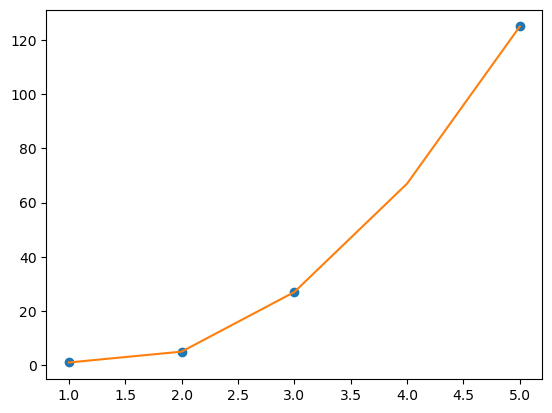

In [176]:
# test cubic intepolatation
import pandas as pd
import numpy as np
from scipy.interpolate import interp1d
import matplotlib.pyplot as plt
from scipy.interpolate import CubicSpline

df = pd.DataFrame([np.arange(1, 6), [1, 5, 27, np.nan, 125]]).T

test = [1, 5, 27, 31, 67, 89]
print(test[4:6])

df2 = df.dropna() # interpolate on the non nan
f = CubicSpline(df2[0], df2[1])  # , kind='cubic')

df[1] = df[0].apply(f)

# plot
plt.plot(df2[0], df2[1], 'o')
plt.plot(df[0], df[1], '-')
plt.show()

In [202]:
from scipy.interpolate import interp1d

count_files_progress = 0

def interpolation(occlusion_tc, occlusion_frame, blendshapes_file: list[dict], rest_face_blendshapes=rest_face_blendshapes, method="linear"):

    start, end = occlusion_frame[0], occlusion_frame[1]
    num_frames = end - start
    # print("num_frames ", num_frames)

    # real timecode for the rest face blendshapes when inside the gap
    start_tc, end_tc = occlusion_tc[0], occlusion_tc[1]
    # get list of timecodes between start and end
    gap_timecodes = [blendshapes_file[i]["Timecode"] for i in range(start, end) if len(blendshapes_file) > i]
    """for i in range(start, end):
        if len(blendshapes_file) > i:
            gap_timecodes.append(blendshapes_file[i]["Timecode"])
        else:
            # TODO: understand this edge case
            print(f"num_frames {num_frames}, file blendshapes length {len(blendshapes_file)}, i {i}, start {start}, end {end}")
            gap_timecodes.append(None)
    """
    # Get previous non occluded frame and next non occluded frame
    if method == "linear":
        if start - 1 < 0:
            first_blendshapes = rest_face_blendshapes
        elif start >= len(blendshapes_file):
            first_blendshapes = rest_face_blendshapes
        else:
            first_blendshapes = blendshapes_file[start-1]
        if len(blendshapes_file) <= end + 1:
            last_blendshapes = rest_face_blendshapes
        else:
            last_blendshapes = blendshapes_file[end+1]

        if len(blendshapes_file) < 3 and num_frames != 0:
            rest_face_blendshapes["Timecode"] = start_tc
            gap_blendshapes = []
            for tc in gap_timecodes:
                rest_face_blendshapes["Timecode"] = tc
                gap_blendshapes.append(rest_face_blendshapes)
            # gap_blendshapes = [rest_face_blendshapes] * num_frames
        elif len(blendshapes_file) < 3 and num_frames == 0:
            rest_face_blendshapes["Timecode"] = start_tc
            gap_blendshapes = [rest_face_blendshapes]
            num_frames = 1
        elif num_frames == 0 and len(blendshapes_file) > 3 and len(blendshapes_file) > end + 1:
            gap_blendshapes = [blendshapes_file[start]]
            num_frames = 1
        elif len(blendshapes_file) > 3 and len(blendshapes_file) <= end + 1:
            # rest_face_blendshapes["Timecode"] = start_tc
            # if num_frames == 0:
            #     num_frames = 1
            # gap_blendshapes = [rest_face_blendshapes] * num_frames
            return None
        else: 
            gap_blendshapes = blendshapes_file[start:end]
        # print("Len of first_blendshapes", len([first_blendshapes]), "Len of last_blendshapes", len([last_blendshapes]), "Len of gap_blendshapes", len(gap_blendshapes))
        gap_blendshapes = [first_blendshapes] + gap_blendshapes + [last_blendshapes]

    elif method == "cubic":
        if start - 2 < 0:
            first_blendshapes = [rest_face_blendshapes]*2
        elif start - 1 < 0:
            first_blendshapes = [rest_face_blendshapes] + [blendshapes_file[start]]
        elif start - 2 > 0 and start < len(blendshapes_file):
            first_blendshapes = [blendshapes_file[start-2]] + [blendshapes_file[start-1]]
        elif start >= len(blendshapes_file):
            first_blendshapes = [rest_face_blendshapes]*2
            print("start >= len(blendshapes_file)")
        else:
            # take 2 blendshapes before the occlusion
            first_blendshapes = [blendshapes_file[start-2]] + [blendshapes_file[start-1]]
        # print("len(first_blendshapes): ", len(first_blendshapes))
        if len(blendshapes_file) == end + 2:
            last_blendshapes = [blendshapes_file[end+1]] + [rest_face_blendshapes]
        elif len(blendshapes_file) <= end + 1:
            last_blendshapes = [rest_face_blendshapes]*2
        else:
            # take two blendshapes after the occlusion
            last_blendshapes = blendshapes_file[end+1:end+3]
        # print("len(last_blendshapes): ", len(last_blendshapes))

        if len(blendshapes_file) < 3 and num_frames != 0:
            rest_face_blendshapes["Timecode"] = start_tc
            gap_blendshapes = []
            for tc in gap_timecodes:
                rest_face_blendshapes["Timecode"] = tc
                gap_blendshapes.append(rest_face_blendshapes)
            # gap_blendshapes = [rest_face_blendshapes] * num_frames
        elif len(blendshapes_file) < 3 and num_frames == 0:
            rest_face_blendshapes["Timecode"] = start_tc
            gap_blendshapes = [rest_face_blendshapes]
            num_frames = 1
        elif num_frames == 0 and len(blendshapes_file) > 3 and len(blendshapes_file) > end + 1:
            gap_blendshapes = [blendshapes_file[start]]
            num_frames = 1
        elif len(blendshapes_file) > 3 and len(blendshapes_file) <= end + 1:
            # rest_face_blendshapes["Timecode"] = start_tc
            # if num_frames == 0:
            #     num_frames = 1
            # gap_blendshapes = [rest_face_blendshapes] * num_frames
            return None
        else: 
            gap_blendshapes = blendshapes_file[start:end]
        # print("Len of first_blendshapes", len(first_blendshapes), "Len of last_blendshapes", len(last_blendshapes))
        gap_blendshapes = first_blendshapes + gap_blendshapes + last_blendshapes
        original_y = first_blendshapes + last_blendshapes
        # print("Original y", original_y)

    
    # print("Len of gap_blendshapes", len(gap_blendshapes))
    gap_blendshapes_df = pd.DataFrame(gap_blendshapes)
    gap_orig_df = pd.DataFrame(original_y)
    # replace None with 0.0
    gap_orig_df.fillna(0.0, inplace=True)
    # print("Len of gap_blendshapes_df.shape[0]", gap_blendshapes_df.shape[0])
    #print(gap_blendshapes_df.head())
    
    for column in gap_blendshapes_df.columns:
        if column not in ["Timecode", "BlendshapeCount", "velocity", "smoothed_velocity"]:
            if method == "linear":
                fill_gap = np.linspace(gap_blendshapes_df.loc[0, column], gap_blendshapes_df.loc[gap_blendshapes_df.shape[0]-1, column], num=num_frames+2)
                assert len(fill_gap) == num_frames + 2
            elif method == "cubic":
                x = np.array([start-2, start-1, end+1, end+2])
                # print("x", type(x), x.shape, x)
                y = gap_orig_df[column]
                # print("y", type(y.to_numpy()), y.shape, y)
                # f = interp1d(x, y, kind='cubic')
                # fill_gap = f(np.linspace(0, len(gap_blendshapes)-1, num=len(gap_blendshapes)-1))
                func = CubicSpline(x, y.to_numpy(), axis=0)
                new_x = np.linspace(start-2, end+2, num=num_frames+4)
                fill_gap = func(new_x)
                # print("len fill_gap", fill_gap.shape, num_frames)
            # print(f"fill_gap for {column} with length {len(fill_gap)}")
            gap_blendshapes_df[column] = fill_gap
    if method == "cubic":
        return gap_blendshapes_df.iloc[2:-2, :]
    else:
        return gap_blendshapes_df.iloc[1:-1, :]


def cubic_interpolation(gap_blendshapes_df, column, num_frames):
    # return fill_gap
    pass


for root, dirs, files in os.walk("./"):
    if root.split('/')[-1].startswith("20241101"):
        video_fps = 60
        num_frames_orig = 0
        duration_seconds = 0
        
        json_path = os.path.join(root, f"take.json")
        with open(json_path, 'r') as f:
            data = json.load(f)
            # this is a Video (!) fps, depth and blendshapes have different fps values 
            video_fps = data["videoTargetFrameRate"]
            num_frames_orig = int(data["frames"])
            start_timecode = data["startTimecode"]
            end_timecode = data["endTimecode"]
            # Calculate the duration of the take in seconds
            start_time_based_on_video = timecode_to_milliseconds(start_timecode, video_fps)
            end_time_based_on_video = timecode_to_milliseconds(end_timecode, video_fps)
            duration_seconds = (end_time_based_on_video - start_time_based_on_video) / 1000

        recording_name = "_".join(root.split('/')[-1].split('_')[1:]) + "_pmil"
        print(recording_name)
        occlusions_tc_file = video_occlusions[recording_name]
        occlusions_frames_file = video_occlusions_frames[recording_name]
        blendshapes_file = video_blendshapes[recording_name]
        # for each file loop over timecodes
        for occlusion_tc, occlusion_frame in zip(occlusions_tc_file,  occlusions_frames_file):
            # print(occlusion_tc, occlusion_frame, blendshapes_file[occlusion_frame[0]: occlusion_frame[1]])
            # interpolate
            gap_blendshapes_df = interpolation(occlusion_tc, occlusion_frame, blendshapes_file, method="cubic")
            if gap_blendshapes_df is None:
                print(f"Gap between {occlusion_frame[0]} and {occlusion_frame[1]} is out of bound of blendshapes\' timecodes for file {recording_name}")
                # static_closed_book_in_front_of_the_face_location_001_1_pmil
                continue
            if gap_blendshapes_df.shape[1] == 55:
                # get all previous and all future timecodes
                # print(gap_blendshapes_df.to_dict('records'))
                video_blendshapes[recording_name] = video_blendshapes[recording_name][:occlusion_frame[0]] + gap_blendshapes_df.to_dict('records') + video_blendshapes[recording_name][occlusion_frame[1]:]
        # print(video_blendshapes[recording_name])
        # костыль
        if len(video_blendshapes[recording_name]) > num_frames_orig:
            print(f"Cutting {len(video_blendshapes[recording_name]) - num_frames_orig} frames from the end of the file {recording_name}")
            video_blendshapes[recording_name] = video_blendshapes[recording_name][:num_frames_orig]
        print(len(video_blendshapes[recording_name]), num_frames_orig)

        count_files_progress += 1

# save to npz
np.savez("blendshapes_timecodes_velocities_cubic_interpolated.npz", video_blendshapes=video_blendshapes)
    

static_ROOF_fingers_contact_at_45_degrees_neutral_location_001_1_pmil
354 354
varg_001_1_pmil
Cutting 2 frames from the end of the file varg_001_1_pmil
824 824
bi_005_5_pmil
387 387
fran_001_1_pmil
1200 1200
parti-vill-kalla-grupp-for-terrorister-1-det_001_1_pmil
583 583
parti-vill-kalla-grupp-for-terrorister-4-nu_002_2_pmil
169 169
katt_001_1_pmil
1046 1046
bok_002_2_pmil
1121 1121
varg_003_3_pmil
Cutting 10 frames from the end of the file varg_003_3_pmil
1065 1065
parti-vill-kalla-grupp-for-terrorister-1-det_003_3_pmil
Cutting 2 frames from the end of the file parti-vill-kalla-grupp-for-terrorister-1-det_003_3_pmil
778 778
djur_001_1_pmil
1319 1319
abborre_002_2_pmil
1169 1169
parti-vill-kalla-grupp-for-terrorister-5-bosattarna_003_3_pmil
636 636
parti-vill-kalla-grupp-for-terrorister-7-det_001_1_pmil
521 521
hundvalp_001_1_pmil
479 479
left_hand_on_top_of_the_battery_neutral_location_001_1_pmil
381 381
parti-vill-kalla-grupp-for-terrorister-5-bosattarna_001_1_pmil
1295 1295
touch_ch

Create blendshapes csv for visualization

In [203]:
# save column to blendshapes file with the same timecodes
files_to_work_with = ["varg_003_3_pmil", "varg_002_2_pmil", "krama_001_1_pmil"]
for file in files_to_work_with:
    blendshapes_file = video_blendshapes[file]
    blendshapes_df = pd.DataFrame(blendshapes_file)
    # drop velocity and smoothed_velocity columns
    blendshapes_df = blendshapes_df.drop(columns=["velocity", "smoothed_velocity"])
    print(blendshapes_df.shape)
    # rearrange columns so that Timecode and Blendshapes go first
    cols = blendshapes_df.columns.tolist()
    reordered_columns = cols[-2:] + cols[:-2]
    blendshapes_df = blendshapes_df[reordered_columns]
    print(blendshapes_df.head())
    
    blendshapes_df.to_csv(f"{file}_cubic_interpolated.csv", index=False)

(1065, 53)
          Timecode  BlendshapeCount  BrowDownLeft  BrowDownRight  BrowInnerUp  \
0  16:08:49:28.881               51      0.311359       0.183370     0.001457   
1  16:08:49:29.883               51      0.330014       0.230359     0.001062   
2  16:08:49:30.885               51      0.227259       0.129951     0.002482   
3  16:08:49:31.886               51      0.240812       0.125621     0.002590   
4  16:08:49:32.886               51      0.264517       0.154681     0.001116   

   BrowOuterUpLeft  BrowOuterUpRight  CheekPuff  CheekSquintLeft  \
0         0.003485          0.009018   0.000027     2.002681e-07   
1         0.003973          0.008013   0.000027     1.925177e-07   
2         0.007528          0.013172   0.000023     1.638128e-07   
3         0.006230          0.015386   0.000029     1.789482e-07   
4         0.005672          0.013568   0.000028     2.000474e-07   

   CheekSquintRight  ...  MouthShrugLower  MouthShrugUpper  MouthSmileLeft  \
0      8.431355

### Apply smoothing to interpolated MP blendshapes

with moving average and with linear interpolation

In [208]:
# ====== Smooth blednshapes before ratargetting them onto the avatar ======


def smooth_array(arr, window=3):
    kernel = np.array([1] * window) / window
    smoothed_arr = np.ones_like(arr)
    for i in range(arr.shape[1]):
        smoothed_arr[:, i] = np.convolve(arr[:, i], kernel, mode='same')    
    return smoothed_arr

print(files_to_work_with[1])

def smooth_blendshape_for_file(file):
    arkit_list = video_blendshapes[file]  # varg_002_2_pmil

    video_coeffs = []
    for row in arkit_list:
        frame_coeffs = []
        for category in row:
            if category != 'Timecode' and category != 'BlendshapeCount':
                # prepare for smoothing
                frame_coeffs.append(row[category]) 
        frame_coeffs = np.array(frame_coeffs)
        video_coeffs.append(frame_coeffs)
    video_coeffs = np.stack(video_coeffs, axis=0)
    video_coeffs = smooth_array(video_coeffs)
    print(len(video_coeffs))

    # Put video_coeffs back to the arkit_list
    new_arkit_list = []
    for i, row in enumerate(arkit_list):
        new_row = {}
        for j, category in enumerate(row):
            print(category)
            if category not in ['Timecode', 'BlendshapeCount', 'velocity', 'smoothed_velocity']:
                new_row[category] = video_coeffs[i, j]
            else:
                new_row[category] = row[category]
        print(new_row)
        new_arkit_list.append(new_row)
    return new_arkit_list

for file in files_to_work_with:
    new_arkit_list = smooth_blendshape_for_file(file)
    print(len(new_arkit_list))
    arkit_df = pd.DataFrame(new_arkit_list)
    arkit_df = arkit_df.drop(columns=["velocity", "smoothed_velocity"])
    cols = arkit_df.columns.tolist()
    reordered_columns = cols[-2:] + cols[:-2]
    arkit_df = arkit_df[reordered_columns]
    print(arkit_df.head())
    arkit_df.to_csv(file + '_cubic_interpolated_smooth.csv', index=False)

varg_002_2_pmil
1065
BrowDownLeft
BrowDownRight
BrowInnerUp
BrowOuterUpLeft
BrowOuterUpRight
CheekPuff
CheekSquintLeft
CheekSquintRight
EyeBlinkLeft
EyeBlinkRight
EyeLookDownLeft
EyeLookDownRight
EyeLookInLeft
EyeLookInRight
EyeLookOutLeft
EyeLookOutRight
EyeLookUpLeft
EyeLookUpRight
EyeSquintLeft
EyeSquintRight
EyeWideLeft
EyeWideRight
JawForward
JawLeft
JawOpen
JawRight
MouthClose
MouthDimpleLeft
MouthDimpleRight
MouthFrownLeft
MouthFrownRight
MouthFunnel
MouthLeft
MouthLowerDownLeft
MouthLowerDownRight
MouthPressLeft
MouthPressRight
MouthPucker
MouthRight
MouthRollLower
MouthRollUpper
MouthShrugLower
MouthShrugUpper
MouthSmileLeft
MouthSmileRight
MouthStretchLeft
MouthStretchRight
MouthUpperUpLeft
MouthUpperUpRight
NoseSneerLeft
NoseSneerRight
Timecode
BlendshapeCount
velocity
smoothed_velocity
{'BrowDownLeft': 0.21379122138023374, 'BrowDownRight': 0.13790957629680634, 'BrowInnerUp': 0.0008397633209824561, 'BrowOuterUpLeft': 0.0024859527281175056, 'BrowOuterUpRight': 0.0056768739596

In [106]:
len(new_arkit_list), len(arkit_list)

(1056, 1056)

In [111]:
# Save the ARKit dict to a .csv file with columns Timestamp, Blendshape, Blednshape, ...
# add column 'BlendshapeCount' with a constant value 51

# Before saving, transform the list of dictionaries to a pandas DataFrame
arkit_df = pd.DataFrame(new_arkit_list)
arkit_df = arkit_df.drop(columns=["velocity", "smoothed_velocity"])
cols = arkit_df.columns.tolist()
reordered_columns = cols[-2:] + cols[:-2]
arkit_df = arkit_df[reordered_columns]
arkit_df.head()

,Timecode,BlendshapeCount,BrowDownLeft,BrowDownRight,BrowInnerUp,BrowOuterUpLeft,BrowOuterUpRight,CheekPuff,CheekSquintLeft,CheekSquintRight,...,MouthShrugLower,MouthShrugUpper,MouthSmileLeft,MouthSmileRight,MouthStretchLeft,MouthStretchRight,MouthUpperUpLeft,MouthUpperUpRight,NoseSneerLeft,NoseSneerRight
0,16:08:04:11.047,51,0.133287,0.162527,0.001656,0.004447,0.002608,0.000012,1.077184e-07,2.801765e-07,...,0.031940,0.002336,0.019095,0.019014,0.014207,0.012554,0.000033,0.000075,2.099584e-07,0.000001
1,16:08:04:12.047,51,0.181155,0.211727,0.003073,0.007648,0.005104,0.000018,1.635854e-07,4.530078e-07,...,0.046200,0.003466,0.028809,0.026911,0.021050,0.020791,0.000053,0.000108,3.530002e-07,0.000002
2,16:08:04:13.047,51,0.135466,0.170099,0.004428,0.009590,0.006136,0.000018,1.709668e-07,5.099558e-07,...,0.037302,0.003159,0.031397,0.027741,0.022808,0.025548,0.000053,0.000098,3.888158e-07,0.000002
3,16:08:04:14.047,51,0.139687,0.176914,0.004270,0.009416,0.006067,0.000017,1.830934e-07,5.733417e-07,...,0.035492,0.003501,0.044620,0.039839,0.037654,0.040898,0.000072,0.000138,4.070725e-07,0.000002
4,16:08:04:15.047,51,0.132061,0.177331,0.004307,0.009855,0.006114,0.000017,1.797024e-07,5.776042e-07,...,0.029546,0.003179,0.044058,0.039388,0.039640,0.039111,0.000067,0.000132,4.047783e-07,0.000002


In [110]:
arkit_df.to_csv(files_to_work_with[1] + '_linear_interpolated_smooth.csv', index=False)